In [2]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np 
import os
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('Файл(ы) "{name}" размером {length} байт загружен(ы)'.format(
      name=fn, length=len(uploaded[fn])))

Saving Ivan Mladek.jpg to Ivan Mladek.jpg
Saving Ivo Pesak.jpg to Ivo Pesak.jpg
Saving Jozin z Bazin.mp4 to Jozin z Bazin.mp4
Saving photo.jpg to photo.jpg
Saving po.jpg to po.jpg
Файл(ы) "Ivan Mladek.jpg" размером 7682 байт загружен(ы)
Файл(ы) "Ivo Pesak.jpg" размером 18400 байт загружен(ы)
Файл(ы) "Jozin z Bazin.mp4" размером 8101389 байт загружен(ы)
Файл(ы) "photo.jpg" размером 198168 байт загружен(ы)
Файл(ы) "po.jpg" размером 234080 байт загружен(ы)


Saved to po.jpg


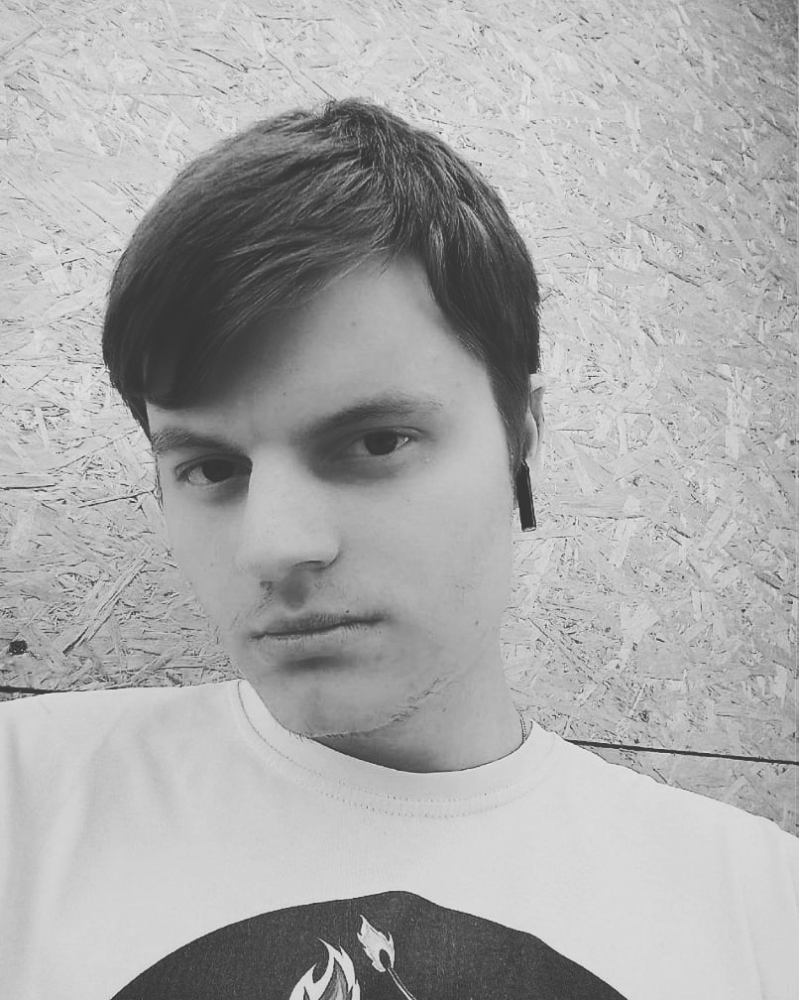

In [4]:
from IPython.display import Image
try:
  filename = 'po.jpg'
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [5]:
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_profileface.xml

--2023-04-09 06:27:24--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 930127 (908K) [text/plain]
Saving to: ‘haarcascade_frontalface_default.xml’

haarcascade_frontal 100%[===================>] 908.33K  --.-KB/s    in 0.03s   

2023-04-09 06:27:24 (33.7 MB/s) - ‘haarcascade_frontalface_default.xml’ saved [930127/930127]

--2023-04-09 06:27:24--  https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_profileface.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:

In [6]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
face_profile_cascade = cv2.CascadeClassifier('haarcascade_profileface.xml')

In [7]:
photos = list(filter(lambda x : '.jpg' in x, os.listdir()))
photos

['Ivan Mladek.jpg', 'Ivo Pesak.jpg', 'po.jpg', 'photo.jpg']

In [8]:
def face_det_cv2(photo_name):
    img = cv2.imread(photo_name)
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Для детекции нужно сделать изображение черно-белым
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Детектируем лица в анфас
    faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(200, 200)) # 1.1 и 5 - это гиперпараметры, их перебор позволяет регулировать детекцию
    # Нарисуем зеленые прямоугольники вокруг лиц.
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 5)

    # проверим лица в профиль
    faces = face_profile_cascade.detectMultiScale(gray, 1.1, 3, minSize=(200, 200))
    # Нарисуем прямоугольники вокруг лиц.
    for (x, y, w, h) in faces:
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 5)
    # Посмотрим что получилось
    plt.figure(figsize=(8,8), dpi=90)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

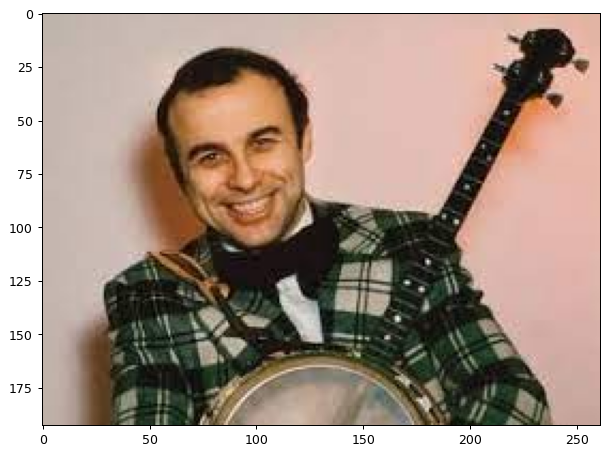

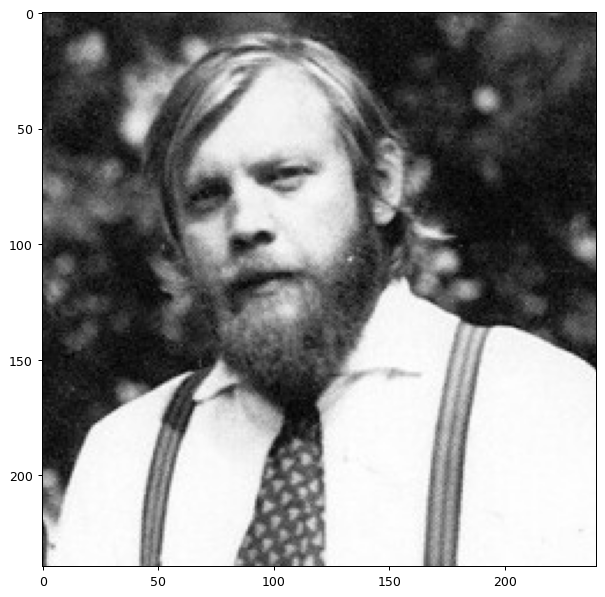

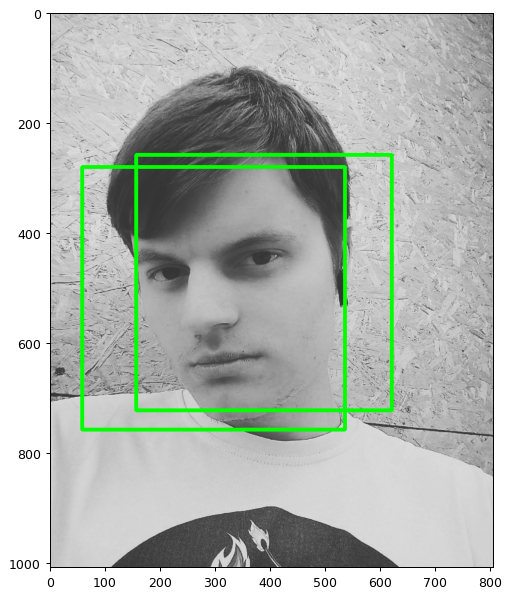

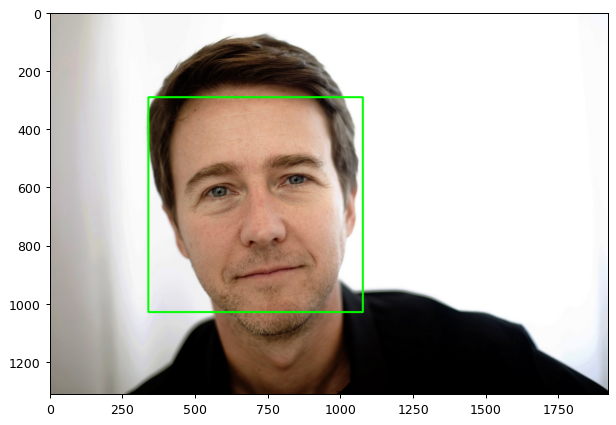

In [9]:
for photo in photos:
    face_det_cv2(photo)

In [10]:
!pip install face_recognition

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 10.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566185 sha256=febe685e5dd9398521b21540ff6d73cb46bdfc363c9c20187e3363233f3fea06
  Stored in directory: /root/.cache/pip/wheels/22/a8/60/4a2aeb763d63f50190f4c4e07069a22245347eeafdb3a67551
Successfully built face-recognition-models


In [11]:
import face_recognition

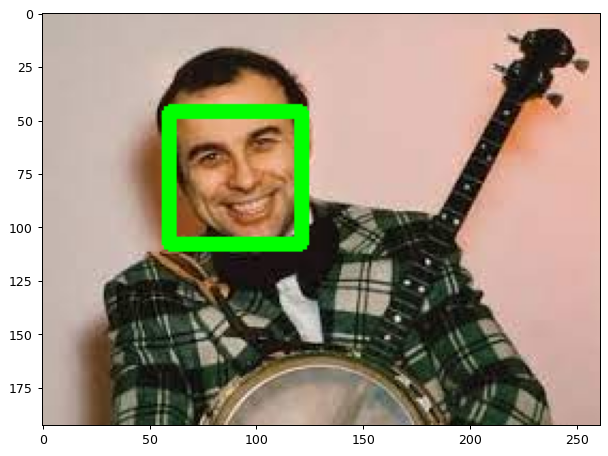

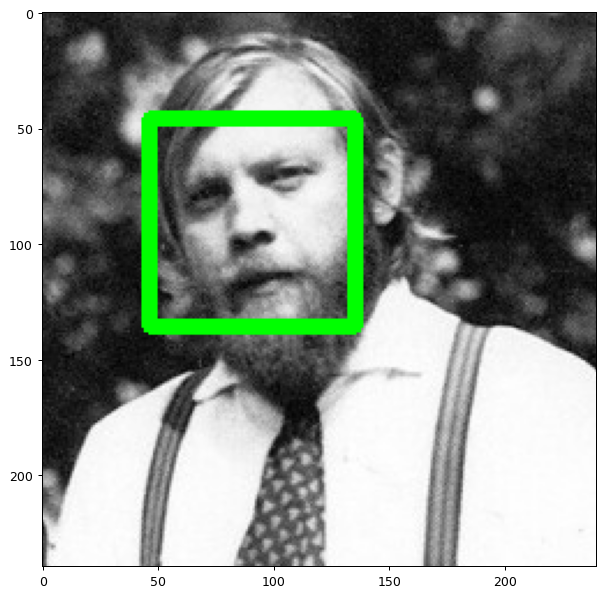

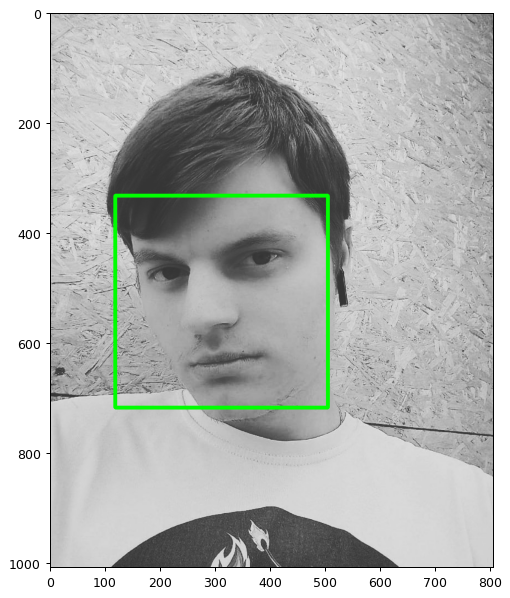

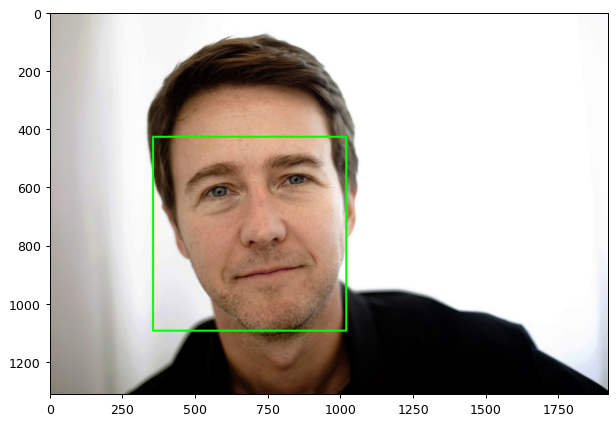

In [12]:
def face_det_fr(photo_name):
    image_processed = face_recognition.load_image_file(photo_name)
    face_location = face_recognition.face_locations(image_processed)
    img = cv2.imread(photo_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for (top, right, bottom, left) in (face_location):
        cv2.rectangle(img, (left, top), (right, bottom), (0, 255, 0), 5)
    # Посмотрим что получилось
    plt.figure(figsize=(8,8), dpi=90)
    plt.imshow(img)
    plt.show()

for photo in photos:
    face_det_fr(photo)

In [14]:
!pip install mtcnn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 41.6 MB/s eta 0:00:00


In [15]:
from mtcnn import MTCNN

1/1 [==============================] - 0s 215ms/step


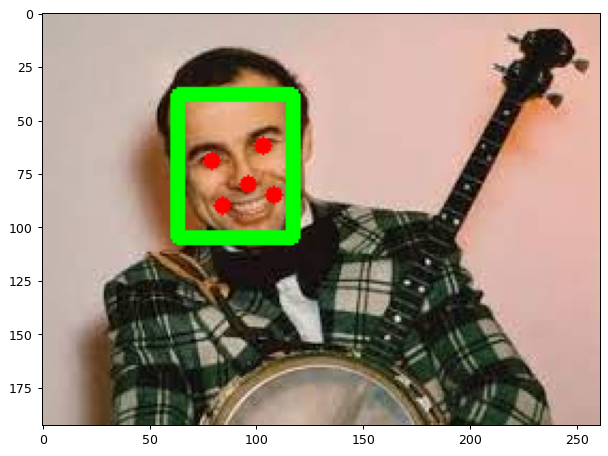

1/1 [==============================] - 0s 204ms/step


1/1 [==============================] - 0s 194ms/step


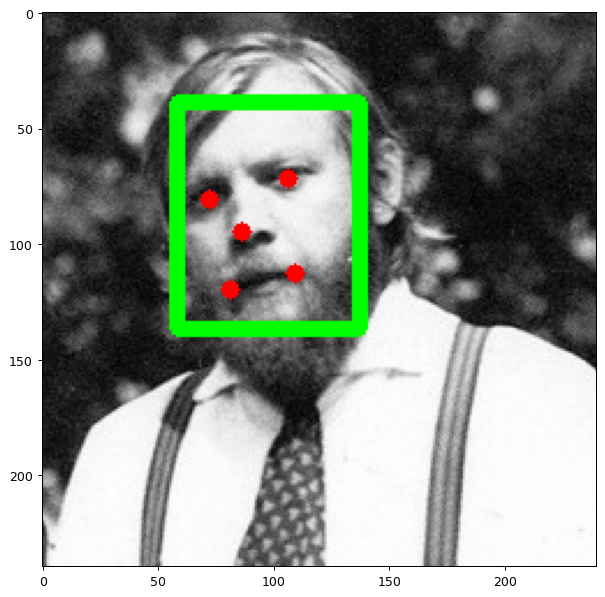

1/1 [==============================] - 0s 298ms/step


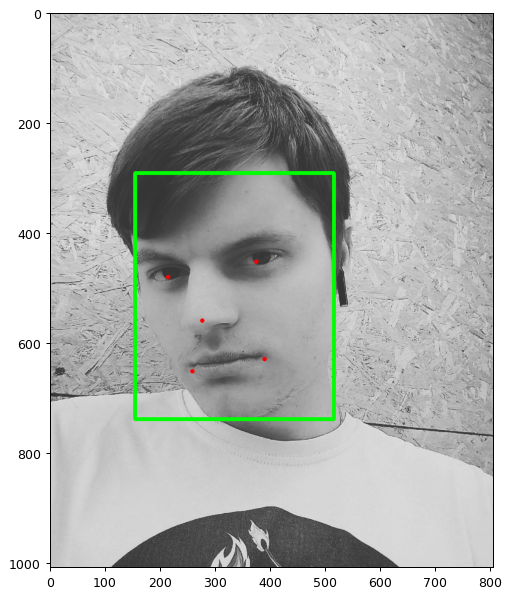

1/1 [==============================] - 0s 123ms/step


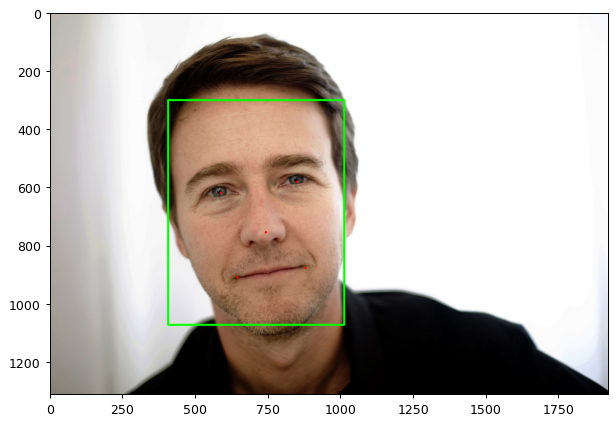

In [16]:
def face_det_mtcnn(photo_name):
    img = cv2.imread(photo_name)
    detector = MTCNN()

    face_list = detector.detect_faces(img) # face detect and alignment

    for face in face_list:
        box = face["box"]
        keypoints = face["keypoints"]

        # draw boundingbox
        x,y,w,h = box
        cv2.rectangle(img,(x,y),(x+w,y+h),(0,255,0),5)

        # draw keypoints
        cv2.circle(img,keypoints["left_eye"],1,(0,0,255),5)
        cv2.circle(img,keypoints["right_eye"],1,(0,0,255),5)
        cv2.circle(img,keypoints["nose"],1,(0,0,255),5)
        cv2.circle(img,keypoints["mouth_left"],1,(0,0,255),5)
        cv2.circle(img,keypoints["mouth_right"],1,(0,0,255),5)
    
    # Посмотрим что получилось
    plt.figure(figsize=(8,8), dpi=90)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

for photo in photos:
    face_det_mtcnn(photo)

In [17]:
from IPython.display import HTML
from base64 import b64encode
#mp4 = open('video1.mp4','rb').read()
mp4 = open('Jozin z Bazin.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [18]:
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [19]:
#input_video = "video1.mp4" #Загруженное видео
input_video = "Jozin z Bazin.mp4"

output_video = 'output.avi' #Выходное видео

output_video_res = (640, 360) #разрешение выходного видео

photo_pattern = "Ivo Pesak.jpg" # фото-образец для распознования на видео
photo_pattern2 = "Ivan Mladek.jpg" 

sign_photo = "Ivan Mladek" #Подпись лица на видео
sign2 = "Ivo Pesak"

In [20]:
# открываем наше видео
input_movie = cv2.VideoCapture(input_video)
length = int(input_movie.get(cv2.CAP_PROP_FRAME_COUNT))

In [32]:
fourcc = cv2.VideoWriter_fourcc(*'XVID')
output_movie = cv2.VideoWriter(output_video, fourcc, 25, output_video_res)

image = face_recognition.load_image_file(photo_pattern)
image2 = face_recognition.load_image_file(photo_pattern2)
face_encoding = face_recognition.face_encodings(image)[0]
face_encoding2 = face_recognition.face_encodings(image2)[0]

known_faces = [
    face_encoding,
    face_encoding2
]

face_locations = []
face_encodings = []
face_names = []
frame_number = 0

while True:
    # Берем отдельный кадр видео
    ret, frame = input_movie.read()
    frame_number += 1

    # Если кадры кончились, то завершаем цикл
    if not ret:
        break

    # Преобразовываем каждый кадр из BGR -> RGB (особенности работы opencv)
    rgb_frame = frame[:, :, ::-1]

    # Находим все лица на текущем кадре
    face_locations = face_recognition.face_locations(rgb_frame)
    face_encodings = face_recognition.face_encodings(rgb_frame, face_locations)

    face_names = []
    for face_encoding in face_encodings:
        
        # Проверяем, есть ли целевое лицо среди найденных
        match = face_recognition.compare_faces(known_faces, face_encoding, tolerance=0.50)

       
        name = None
        if match[0]:
            name = sign_photo # Если найдено целевое лицо, то присваиваем переменной нужную подпись
            num = 200
        if match[1]:
            name = sign2
            num = 100

        face_names.append(name)

    # Подписываем результат
    for (top, right, bottom, left), name in zip(face_locations, face_names):
        if not name:
            continue
        
        cv2.rectangle(frame, (left, top), (right, bottom), (0, num, 0), 2) # Обводим лицо рамкой зеленого цвета

        # Рисуем квадрат с подписью на кадре
        cv2.rectangle(frame, (left, bottom - 25), (right, bottom), (0, num, 0), cv2.FILLED)
        font = cv2.FONT_HERSHEY_DUPLEX
        cv2.putText(frame, name, (left + 6, bottom - 6), font, 0.5, (255, num, 255), 1)

    # Записываем текущий кадр в наше видео
    print("Writing frame {} / {}".format(frame_number, length))
    output_movie.write(frame)

In [28]:
!ffmpeg -i output.avi output.mp4

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

In [29]:
mp4 = open('output.avi','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [30]:
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [31]:
files.download('output.avi')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>